<a href="https://colab.research.google.com/github/fdch/dreamsound/blob/main/DreamSound_v_1_5.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# DreamSound

https://ai.googleblog.com/2015/06/inceptionism-going-deeper-into-neural.html
https://colab.research.google.com/github/tensorflow/docs/blob/master/site/en/tutorials/generative/deepdream.ipynb


## Prepare Colab

In [2]:
#Get YAMNet
!git clone https://github.com/tensorflow/models.git > /dev/null 2>&1
%cd models/research/audioset/yamnet
# Download YAMNet data
!curl -O https://storage.googleapis.com/audioset/yamnet.h5 > /dev/null 2>&1

/content/models/research/audioset/yamnet


In [3]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [4]:
################################################################################
#
#  DreamSound class
#
#  Get YAMNet
#  $ git clone https://github.com/tensorflow/models.git > /dev/null 2>&1
# 
#  $ cd models/research/audioset/yamnet
# 
#  Download YAMNet data
#  $ curl -O https://storage.googleapis.com/audioset/yamnet.h5 > /dev/null 2>&1
#  
#
#
###############################################################################

import numpy as np
import matplotlib.pyplot as plt
import IPython.display as ipd
from librosa.feature import melspectrogram as librosa_mel
from librosa.core import load as librosa_load
import tensorflow as tf
import params as yamnet_params
import yamnet as yamnet_model

class DreamSound:

    sr = 22050
    max_dur = 10
    patch_hop = 0.1 # seconds

    # fft params
    win_length = tf.constant(2048)
    hop_length = tf.constant(128)
    pad_end = False
    norm_factor = tf.constant(5.999975341271492)

    # loss power
    loss_power = tf.constant(0.001)
    
    # plotting
    plot_every = 10
    figsize = (12,4)
    top_db = 80.0

    # perfom
    step_size = 0.95
    output_type = 3
    steps = 10
    threshold = 1e-07
    classid = None
    maxloss = True
    elapsed_steps = 0
    enable = 0 # prevent loading recursively on first run
    
    # filter
    w_tgt = None
    power = 1.0

    def __init__(self, paths=None, layer=None):

        # fill in array 'audio' with sounds as audio data 
        self.audio = []
        if paths is not None:
            self.load_audio(paths)
        self.load_model(layer)
    
    def load_model(self, layer):
        # load its class names
        self.class_names = yamnet_model.class_names('yamnet_class_map.csv')    
        # load model parameters and get model
        self.params = yamnet_params.Params(sample_rate=self.sr, 
                                           patch_hop_seconds=self.patch_hop)
        self.model = yamnet_model.yamnet_frames_model(self.params)
        # load model weigths
        self.model.load_weights('yamnet.h5')
        if layer is not None:
            self.layername = layer
        else:
            print("Using last layer.")
            self.layername = self.model.layers[-1].name
        print(f"Yamnet loaded, using layer:{self.layername}")

        # Maximize the activations of these layers
        self.layers = self.model.get_layer(self.layername).output
        # Create the feature extraction model
        self.dreamer = tf.keras.Model(inputs=self.model.input, outputs=self.layers)

        print("Dreamer started.")

    def load_audio(self, paths):
        print("Loading audio files...")
        for p in paths:
            y,_ = librosa_load(p, sr=self.sr, duration=self.max_dur)
            self.audio.append(y)
        print("Done.")
        print(f"I have now {len(self.audio)} audio files in memory.")

    def clear_audio(self):
        del self.audio
        self.audio = []
        print(f"I have now {len(self.audio)} audio files in memory.")

    def get_class(self, classid):
        if isinstance(classid, str):
            res = []
            for i, x in enumerate(self.class_names):
                if classid in x:
                    print(i,x)
                    res.append(i)
            return res
        elif isinstance(classid,int):
            return self.class_names[classid]
        else:
            print(f"Can't parse: {type(classid)}")
    
    def summary(self):
        self.model_name.summary()
    
    def stft(self, x):
        return tf.signal.stft(x,
                              self.win_length,
                              self.hop_length,
                              pad_end=self.pad_end)
        
    def istft(self, x):
        return tf.signal.inverse_stft(x, 
                                      self.win_length, 
                                      self.hop_length)

    def complex_mul(self, x, y, norm=False):
        x_imag = tf.math.real(x)
        x_real = tf.math.imag(x)
        if norm:    
            # normalize real and imag
            x_real /= tf.math.reduce_max(tf.math.abs(x_real))
            x_imag /= tf.math.reduce_max(tf.math.abs(x_imag))
        
        conv = tf.dtypes.complex(self.add_min_length(x_real,y,tf.math.multiply),
                                 self.add_min_length(x_imag,y,tf.math.multiply))
        return conv
    
    def add_min_length(self, x, y, fun):
        if x.shape[0] < y.shape[0] : y = y[:x.shape[0]]
        if y.shape[0] < x.shape[0] : x = x[:y.shape[0]]
        return fun(x,y)


    def combine_spectra(self, x, y):
        
        # take short time fourier transform
        X = self.stft(x)
        Y = self.stft(y)
        
        tf.print(tf.math.reduce_mean(tf.math.abs(X)))
        tf.print(tf.math.reduce_std(tf.math.abs(X)))
        
        # take magnitude
        Yabs = tf.math.abs(y) ** 2
        
        # get rid of tiny values
        Hfilt = Yabs * 0.5 * ( tf.math.sign(Yabs - self.threshold) + 1 )
        Hfilt *= self.step_size
    
        # multiply the magnitude with the complex pair
        Yfilt = self.complex_mul(Y, Hfilt, norm=True)
    
        # combine complex values and take inverse fourier
        combined = istft(self.add_min_length(X,Yfilt,tf.math.add))

        return combined    
    
    def combine_spectra_2(self, x, y, target=None):
        
        # x is filtered
        # y is the filter if target is none

        X = self.stft(x)

        if target is not None:
            F = self.stft(target)
            Fabs = tf.math.abs(F) ** self.power
            filter = Fabs
        else:
            Y = self.stft(y)
            Yabs = tf.math.abs(Y) ** self.power
            filter = Yabs

        norm_filter = filter / tf.math.reduce_max(filter)
        filter_thresh = norm_filter - self.threshold

        filter *= (tf.math.sign(filter_thresh) + 1) * 0.5
        filter *= self.step_size

        # multiply the magnitude with the complex pair
        X_filtered = self.complex_mul(X, filter, norm=True)

        x_real = self.istft(X_filtered)
        combined = self.add_min_length(x_real, y, tf.math.add)

        # muy acoplado al audio utilizado    
        return combined, x_real, filter

    def calc_loss(self, data):

        layer_activations, argmax = self.class_from_audio(data)

        if self.classid is not None:
            loss =  tf.reduce_sum(layer_activations[:,self.classid])
        else:
            loss =  tf.reduce_sum(layer_activations[:,argmax])

        return loss ** self.loss_power, self.class_names[argmax]

    def class_from_audio(self, waveform):
        # Pass forward the data through the model to retrieve the activations.
        layer_activations = self.dreamer(waveform)
        reduced = tf.reduce_mean(layer_activations, axis=0)
        argmax = tf.argmax(reduced)
        return layer_activations, argmax

    def dream_big(self, source, target=None):
        
        wt =  tf.convert_to_tensor(source)

        if target is not None:
            wt_tgt = tf.convert_to_tensor(target)
            _, self.classid = self.class_from_audio(wt_tgt)
            tf.print(f"Target class: { self.class_names[self.classid] }...")
        else:
            wt_tgt = None

        wr_ = None
        wf_ = None

        loss = tf.constant(0.0)

        for i in tf.range(self.steps):

            with tf.GradientTape() as tape:
                tape.watch(wt)
                loss, c = self.calc_loss(wt)
           
            tf.print(f"Running step {self.elapsed_steps}, class: {c}...")

            gradients = tape.gradient(loss, wt)
            gradients /= tf.math.reduce_std(gradients)

            if self.output_type == 0:
                # combine spectra
                wt = self.combine_spectra(wt, gradients)
            elif self.output_type == 1:
                # default
                # In gradient ascent, the "loss" is maximized so that 
                # the input image increasingly "excites" the layers.
                # You can update the image by directly adding the gradients
                wt += gradients * self.step_size
            elif self.output_type == 2:
                # combine spectra, flipped
                wt = self.combine_spectra(gradients, wt)
            elif self.output_type == 3:
                # combine spectra, filtering by the original sound
                wt, wr_, wf_ = self.combine_spectra_2(gradients, wt, target=wt_tgt)
            elif self.output_type == 4:
                # combine spectra, filtering by the original sound FLIPPEd
                wt, wr_, wf_ = self.combine_spectra_2(wt, gradients, target=wt_tgt)
            elif self.output_type == 5:
                # return gradients only
                wt = gradients
            else:
                # return only wt
                wt = wt 

            if (i+1) % self.plot_every == 0 and i > 0:
                
                # store data in self arrays                
                self.difference = self.add_min_length(wt,source,tf.math.subtract).numpy()
                self.gradients = gradients.numpy()
                self.wavetensor = wt.numpy()
                
                # plot
                label = f"Step {self.elapsed_steps} - class: {c}"
                self.plot_and_listen(self.wavetensor,label=label)
                self.plot_and_listen(self.difference,label="Difference")
                if wr_ is not None:
                    self.inverse = tf.transpose(wr_).numpy()
                    self.plot_and_listen(self.inverse,label="Filtered")
                if wf_ is not None:
                    self.filter = tf.transpose(wf_).numpy()
                    self.plot_and_listen(self.filter,label="Hard Filter", play=False, wave=False)         
            # end main loop
            self.elapsed_steps += 1 # increment count

        return wt

    def plot_and_listen(self, s=None, label='', wave=True, spec=True, play=True):
        
        if s is None:
            s = self.audio[0]

        if wave:
            self.plot(s,image=False, label=f"{label} - waveform")
            
        if spec:
            ss = librosa_mel(s)
            ss = np.log10(np.maximum(1e-05,ss))*10.0
            ss = np.maximum(ss, ss.max()-self.top_db)
            self.plot(ss, image=True, label=f"{label} - Mel Spectrogram")
        
        if play:
            display(ipd.Audio(s,rate=self.sr))
    

    def play(self):

        self.plot_and_listen()
    
    def plot(self, data, image=True, label=None):
        fig = plt.figure(figsize=self.figsize)
        if image:
            plt.imshow(data, origin="lower", aspect="auto")
        else:
            plt.plot(data)
        if label is not None:
            plt.title(label)
        plt.show()
        plt.close()

    def print(self):
        print(vars(self))

    def __call__(self, audio_index=None, target=None):
        
        if audio_index is None and self.enable:
            w = self.x # recurse
        elif audio_index >= 0 and audio_index <= len(self.audio):
            w = self.audio[audio_index]
        elif audio_index > len(self.audio)-1 or audio_index == -1:
            w = self.audio[-1]
        elif audio_index < 0:
            w = self.audio[0]
        else:
            print("Implement multiple audio dreaming...")
            return None
    
        if audio_index is not None:
            self.elapsed_steps = 0
        
        if target is not None:
            self.w_tgt = self.audio[target]

        self.x = self.dream_big(w, target=self.w_tgt)
        self.enable = 1

# end DreamSound class

In [5]:
!curl -O https://storage.googleapis.com/audioset/speech_whistling2.wav

  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed
100  153k  100  153k    0     0   373k      0 --:--:-- --:--:-- --:--:--  373k


In [6]:
filenames = ["/content/drive/MyDrive/python_scratch/audio/newfiles/audio/simple_piano.wav",
             'speech_whistling2.wav']

In [7]:
ds = DreamSound(filenames)

Loading audio files...
Done.
I have now 2 audio files in memory.
Using last layer.
Yamnet loaded, using layer:activation
Dreamer started.


In [ ]:
print(ds.get_class(466))

Whip


In [ ]:
c = ds.get_class("Whistling")

35 Whistling


In [9]:
ds.power= 1
ds.plot_every = 10
ds.steps = 20
ds.step_size = 0.95
ds.threshold = 1e-07
ds.output_type = 3 
ds.classid = None
# ds.classid = 76 # 'Cat' class

Running step 0, class: Music...
Running step 1, class: Music...
Running step 2, class: Music...
Running step 3, class: Music...
Running step 4, class: Music...
Running step 5, class: Music...
Running step 6, class: Music...
Running step 7, class: Music...
Running step 8, class: Music...
Running step 9, class: Music...


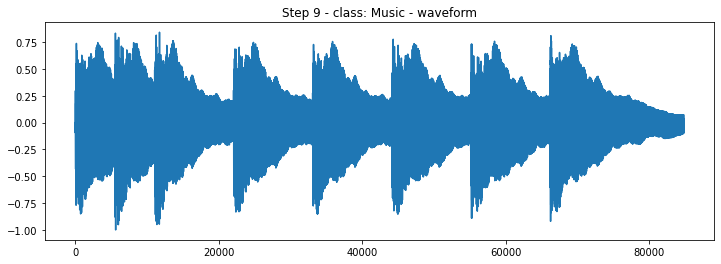

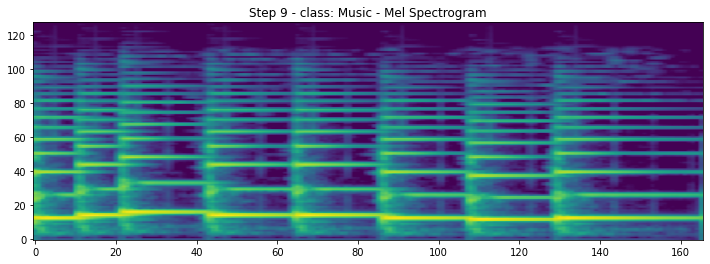

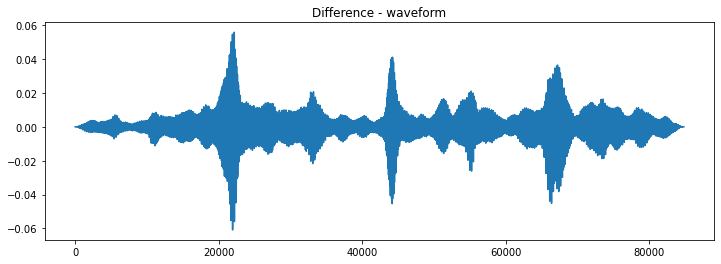

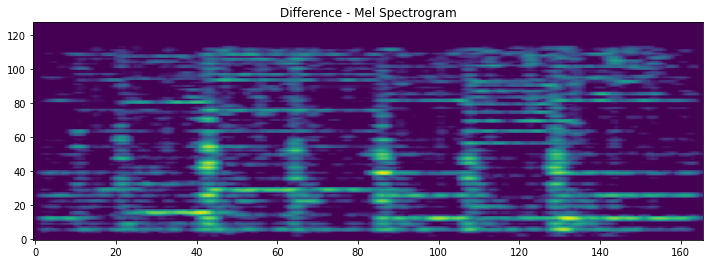

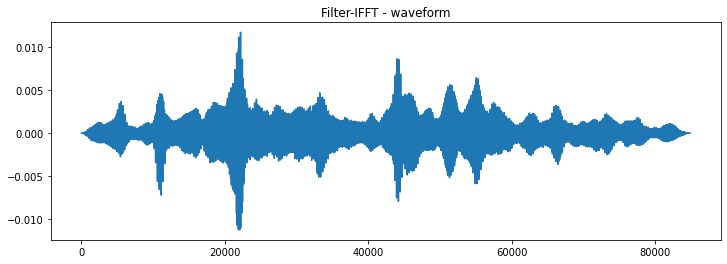

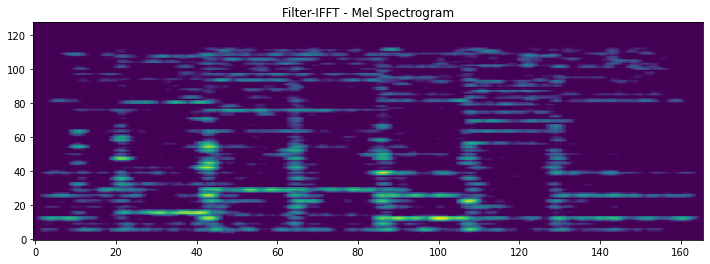

Running step 10, class: Music...
Running step 11, class: Music...
Running step 12, class: Music...
Running step 13, class: Music...
Running step 14, class: Music...
Running step 15, class: Music...
Running step 16, class: Music...
Running step 17, class: Music...
Running step 18, class: Music...
Running step 19, class: Music...


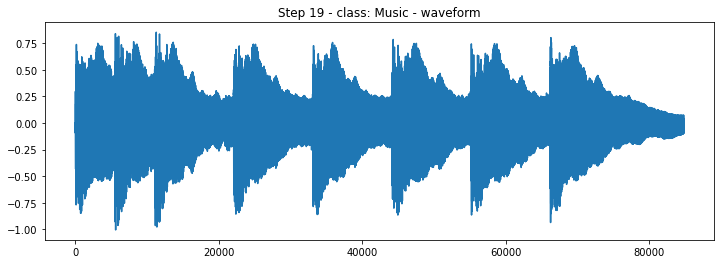

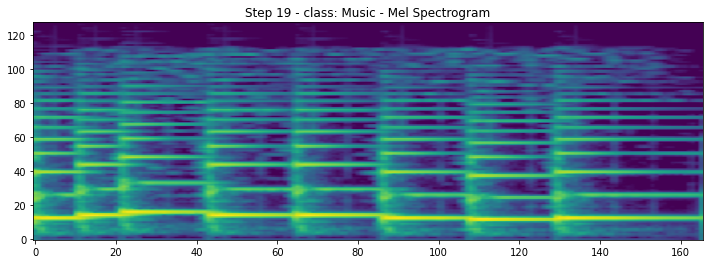

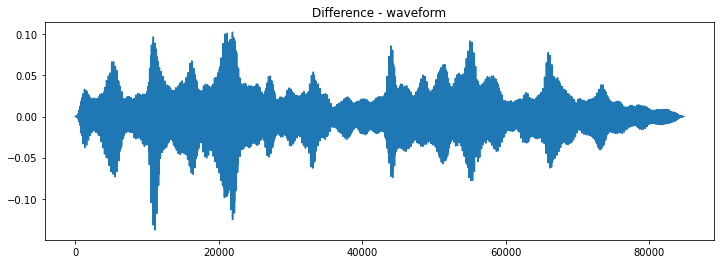

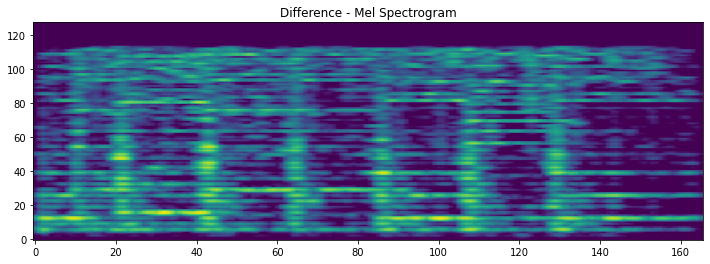

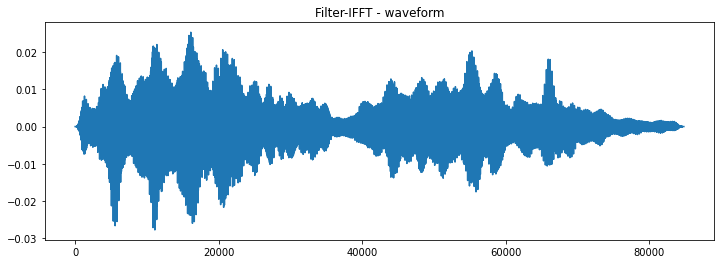

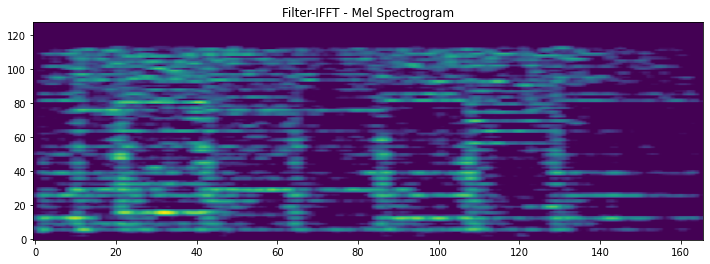

In [10]:
ds(audio_index=0) # use first audio file

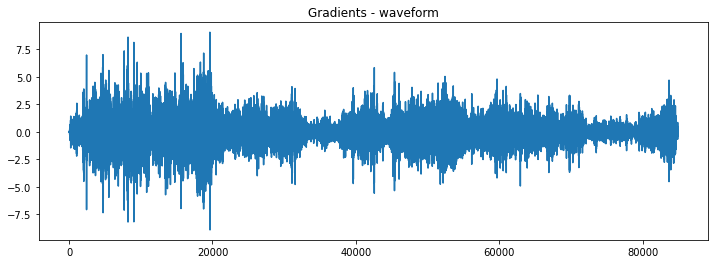

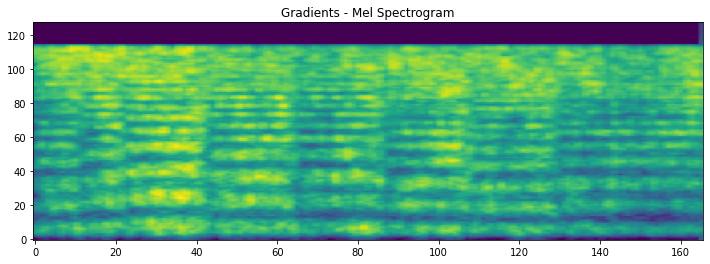

In [11]:
ds.plot_and_listen(ds.gradients, label='Gradients')

Running step 20, class: Music...
Running step 21, class: Music...
Running step 22, class: Music...
Running step 23, class: Music...
Running step 24, class: Music...
Running step 25, class: Music...
Running step 26, class: Music...
Running step 27, class: Music...
Running step 28, class: Music...
Running step 29, class: Music...


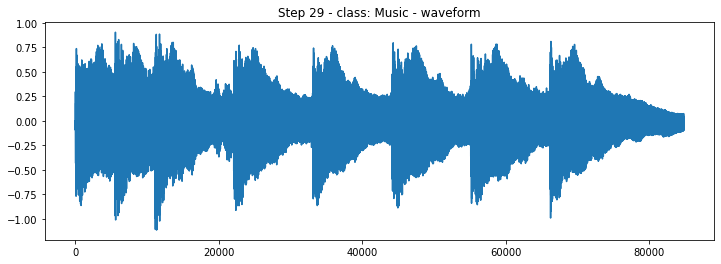

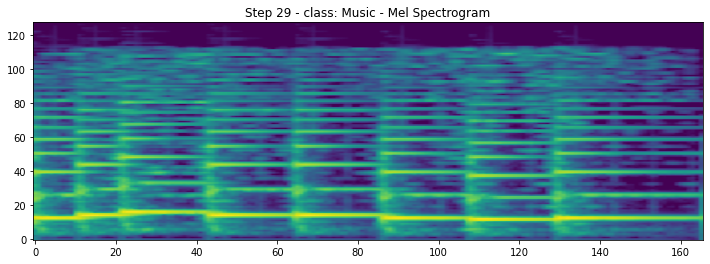

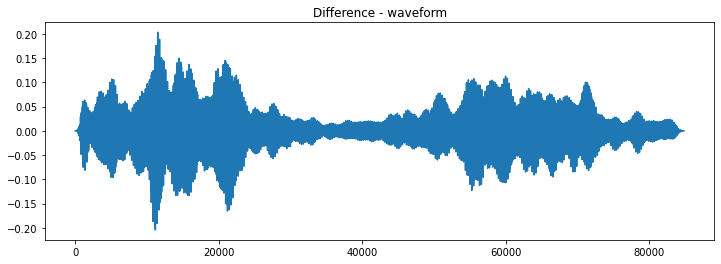

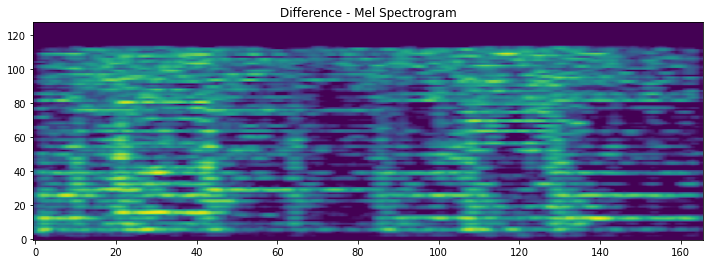

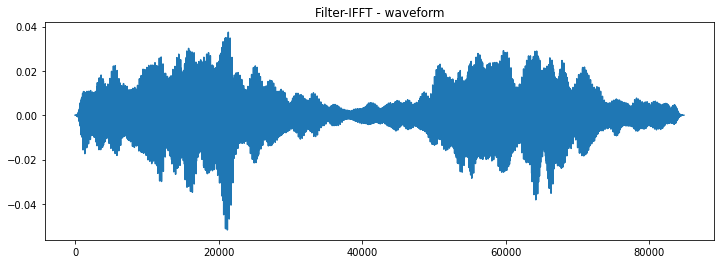

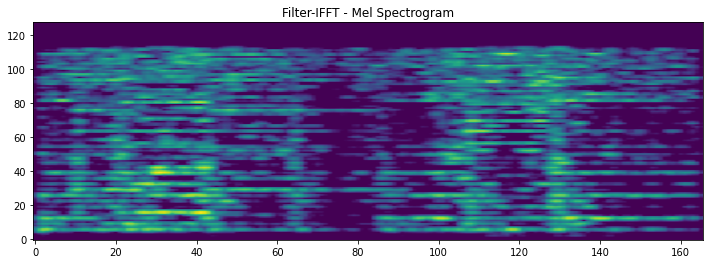

Running step 30, class: Music...
Running step 31, class: Music...
Running step 32, class: Music...
Running step 33, class: Music...
Running step 34, class: Music...
Running step 35, class: Music...
Running step 36, class: Music...
Running step 37, class: Music...
Running step 38, class: Music...
Running step 39, class: Music...


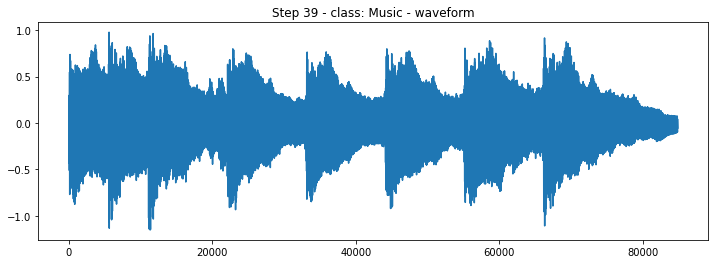

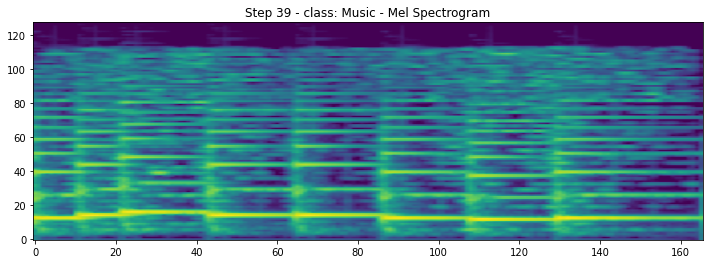

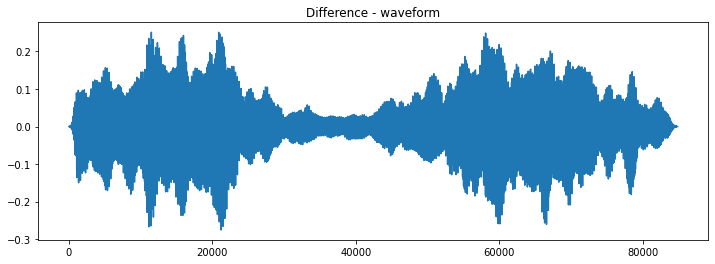

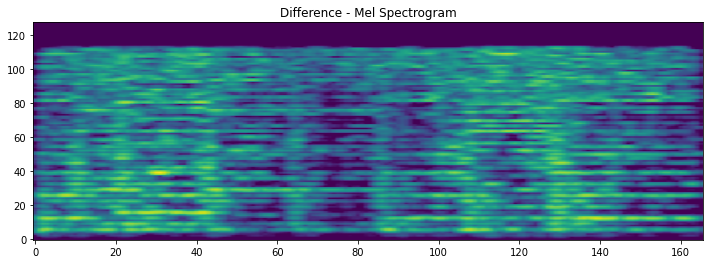

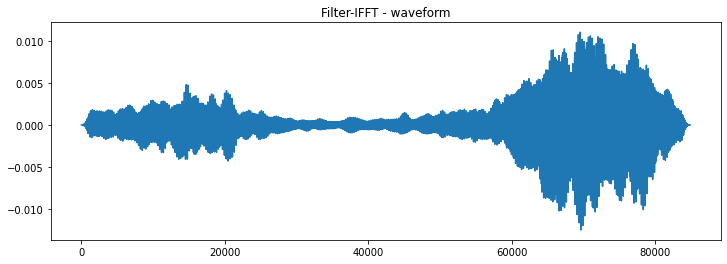

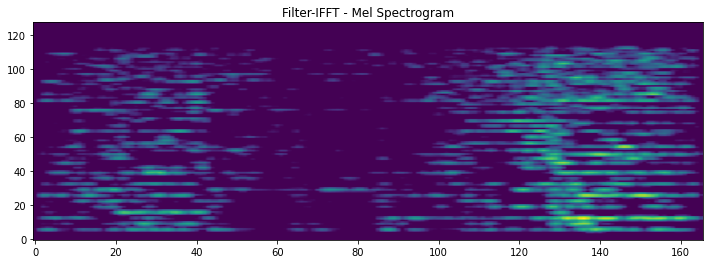

In [12]:
ds()

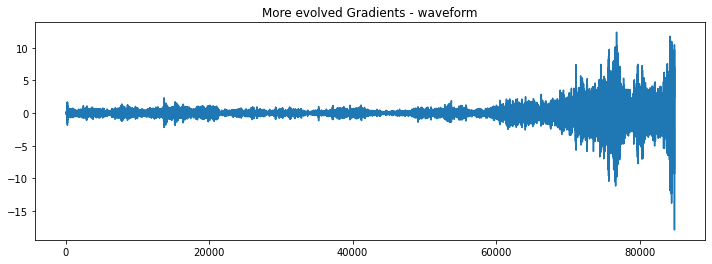

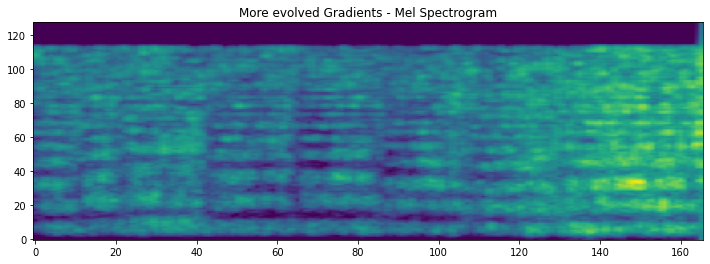

In [13]:
ds.plot_and_listen(ds.gradients, label='More evolved Gradients')

Running step 40, class: Music...
Running step 41, class: Music...
Running step 42, class: Music...
Running step 43, class: Music...
Running step 44, class: Music...
Running step 45, class: Music...
Running step 46, class: Music...
Running step 47, class: Music...
Running step 48, class: Music...
Running step 49, class: Music...


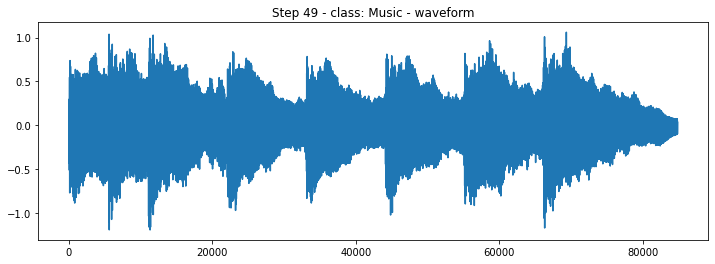

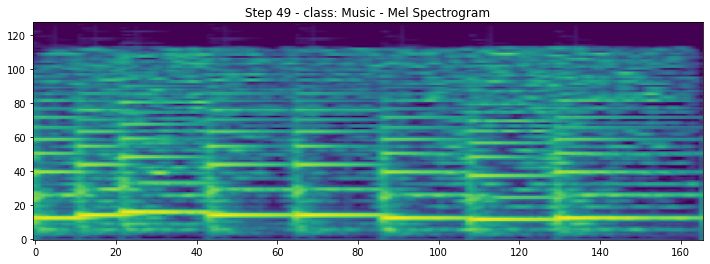

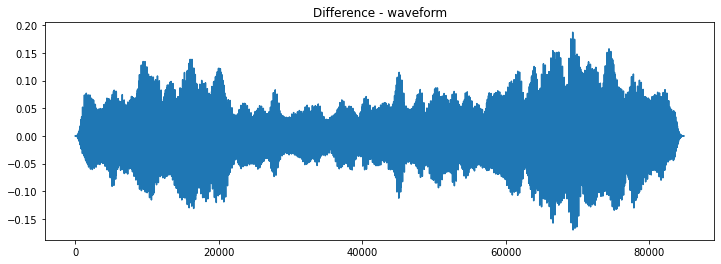

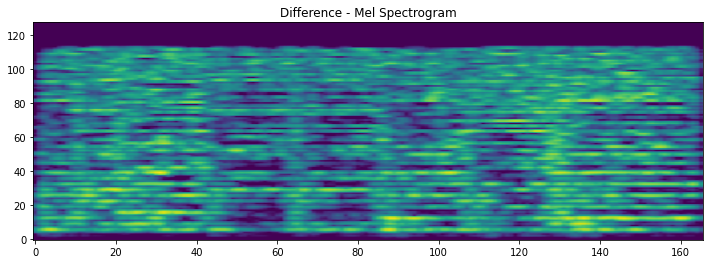

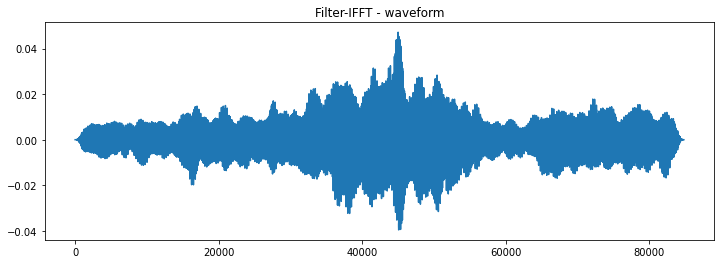

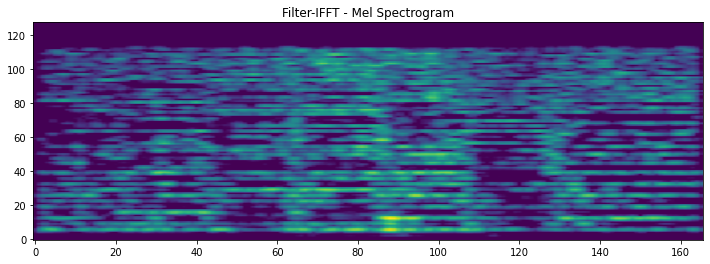

Running step 50, class: Music...
Running step 51, class: Music...
Running step 52, class: Music...
Running step 53, class: Music...
Running step 54, class: Music...
Running step 55, class: Music...
Running step 56, class: Music...
Running step 57, class: Music...
Running step 58, class: Music...
Running step 59, class: Music...


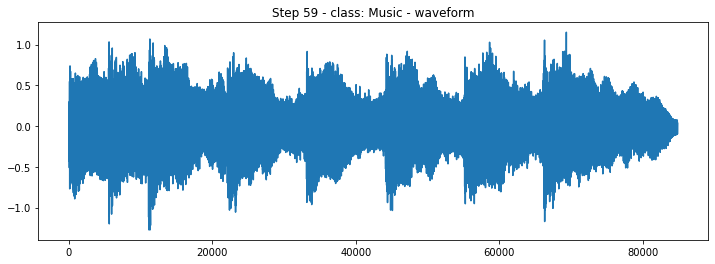

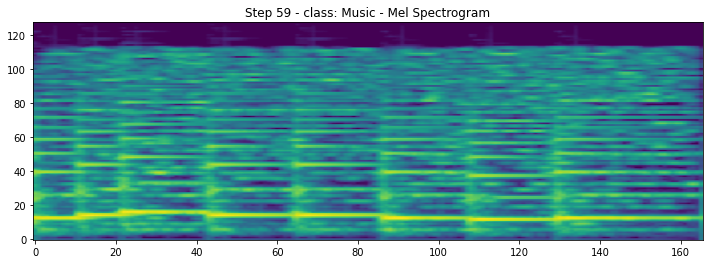

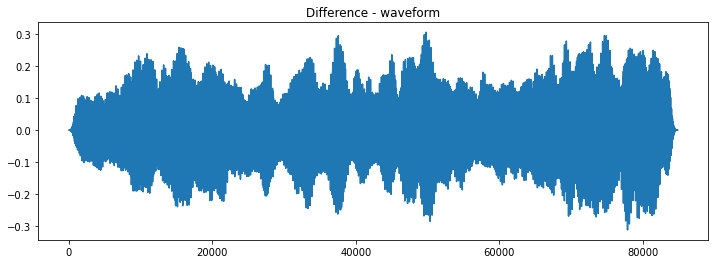

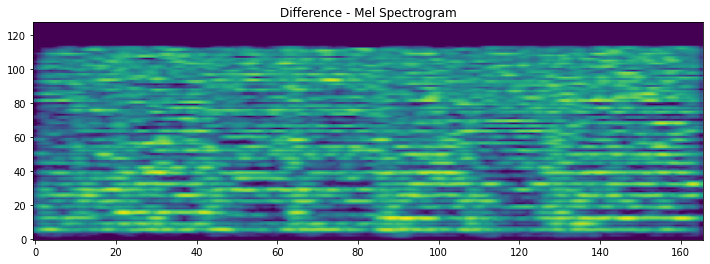

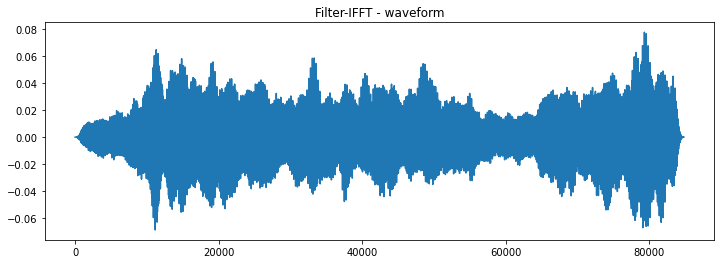

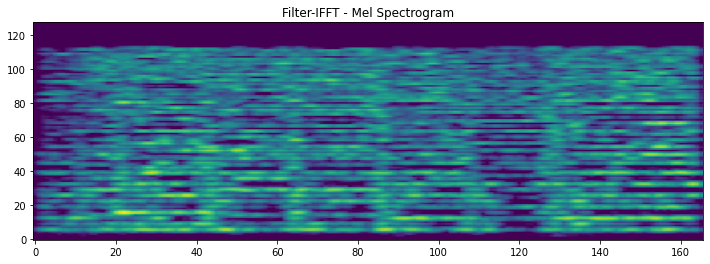

In [14]:
ds()

Running step 60, class: Music...
Running step 61, class: Music...
Running step 62, class: Music...
Running step 63, class: Music...
Running step 64, class: Music...
Running step 65, class: Music...
Running step 66, class: Music...
Running step 67, class: Music...
Running step 68, class: Music...
Running step 69, class: Music...


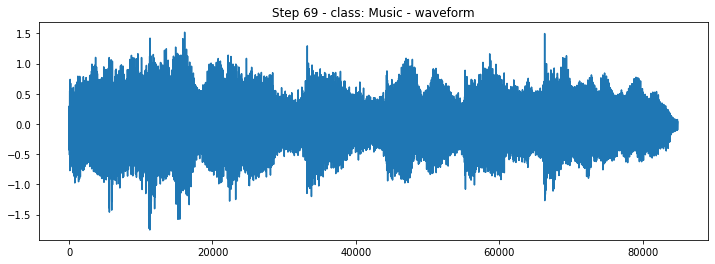

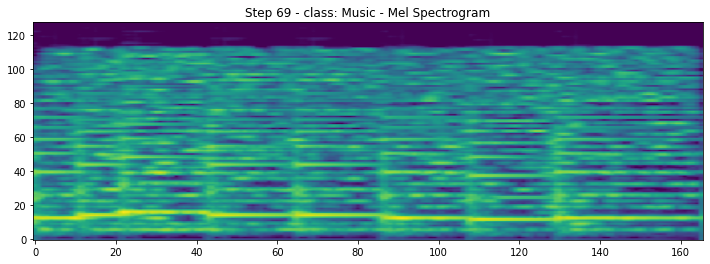

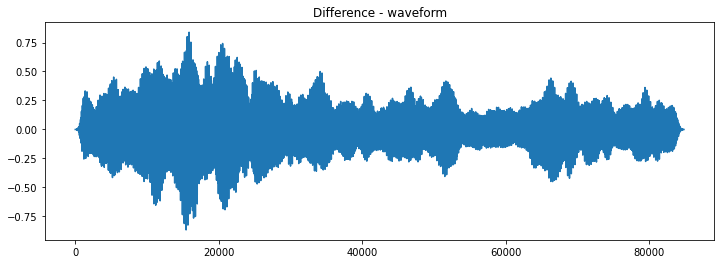

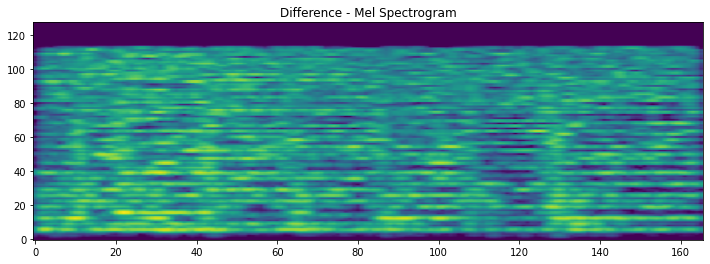

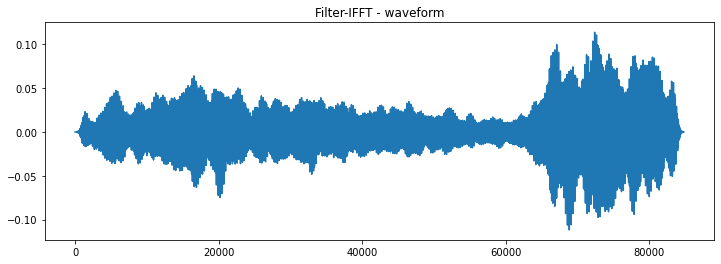

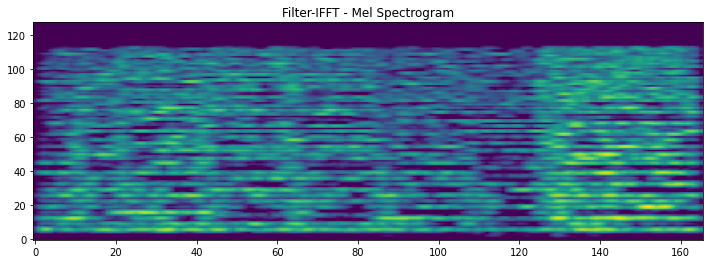

Running step 70, class: Music...
Running step 71, class: Music...
Running step 72, class: Music...
Running step 73, class: Music...
Running step 74, class: Music...
Running step 75, class: Music...
Running step 76, class: Music...
Running step 77, class: Music...
Running step 78, class: Music...
Running step 79, class: Music...


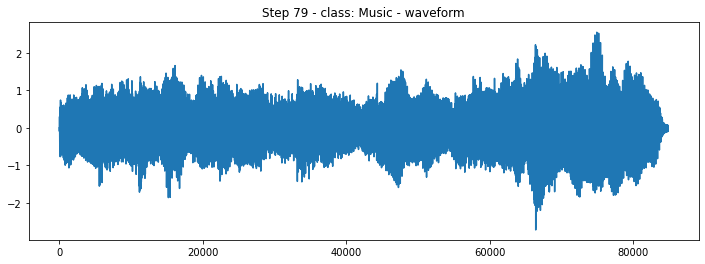

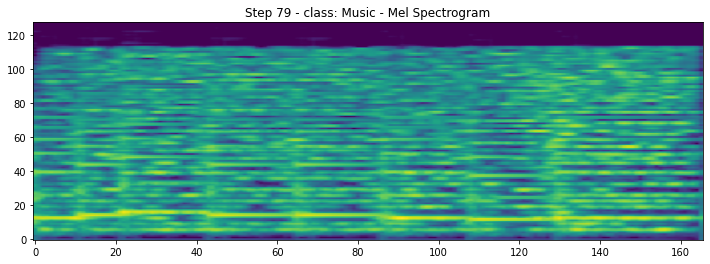

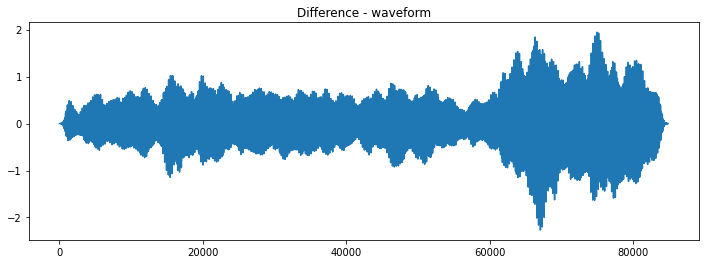

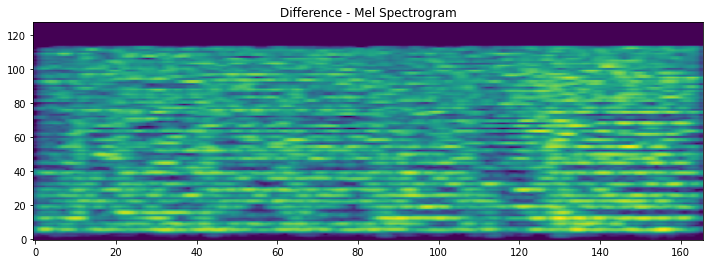

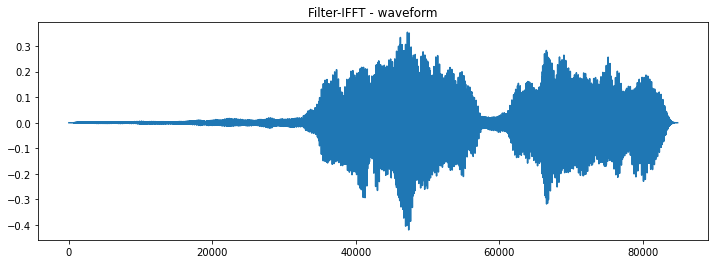

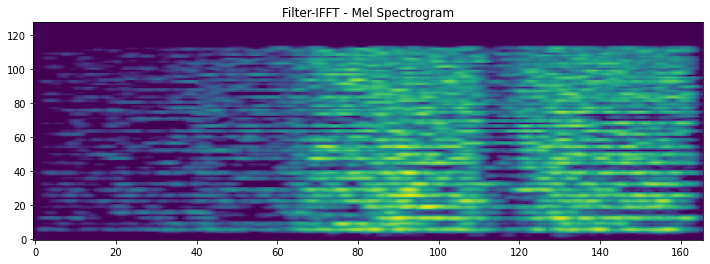

In [15]:
ds()

Running step 80, class: Music...
Running step 81, class: Music...
Running step 82, class: Music...
Running step 83, class: Music...
Running step 84, class: Music...
Running step 85, class: Music...
Running step 86, class: Music...
Running step 87, class: Music...
Running step 88, class: Music...
Running step 89, class: Music...


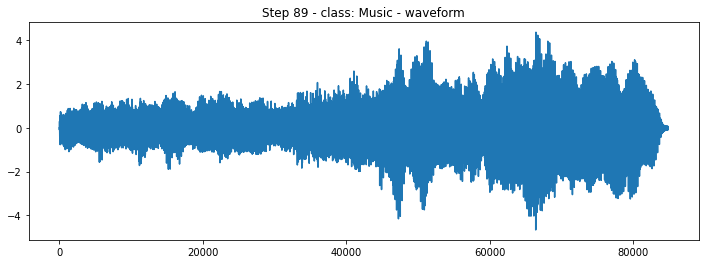

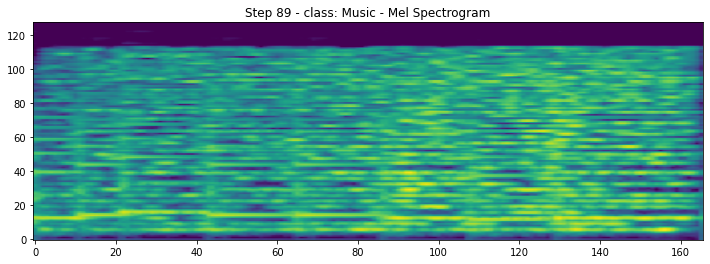

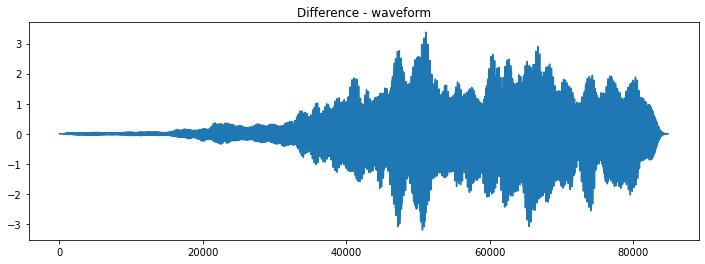

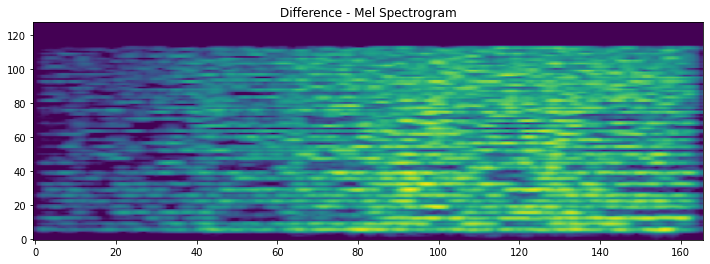

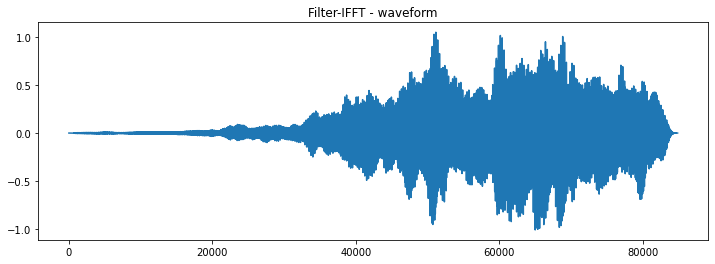

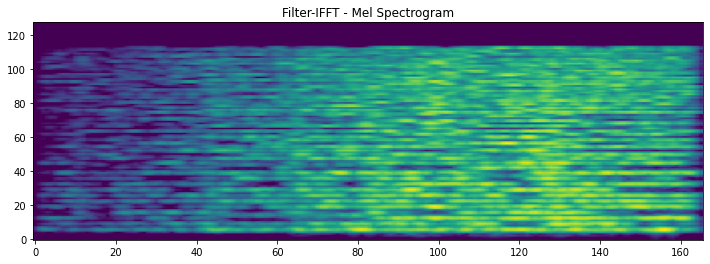

Running step 90, class: Music...
Running step 91, class: Music...
Running step 92, class: Music...
Running step 93, class: Music...
Running step 94, class: Music...
Running step 95, class: Music...
Running step 96, class: Music...
Running step 97, class: Music...
Running step 98, class: Music...
Running step 99, class: Music...


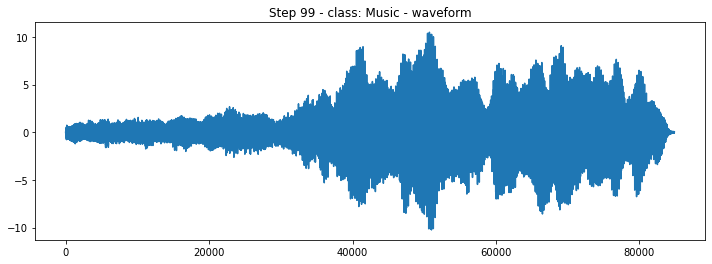

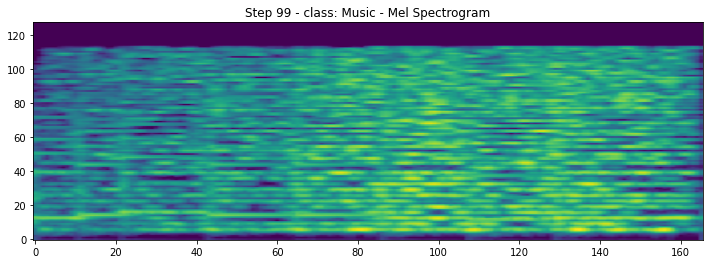

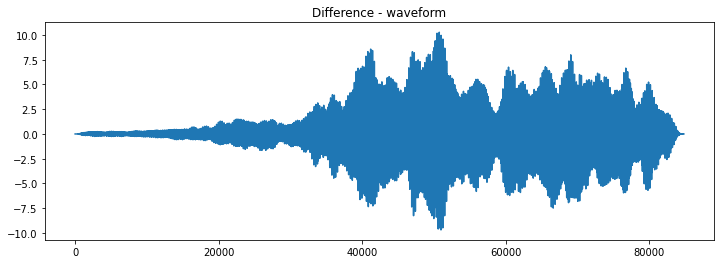

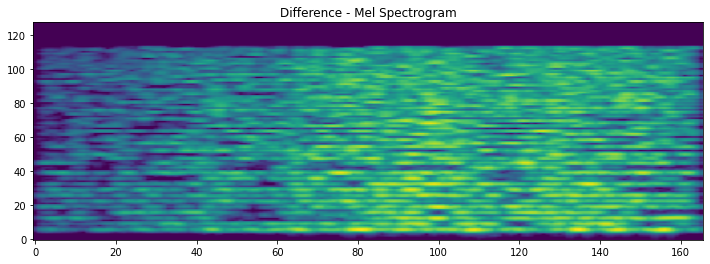

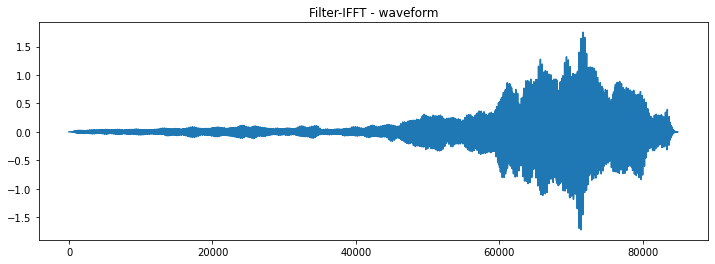

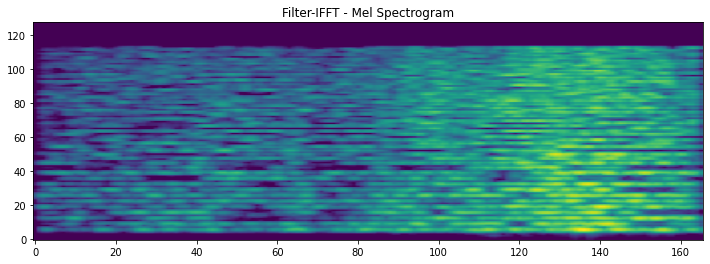

In [16]:
ds()